Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

The config attributes {'skip_prk_steps': True} were passed to LCMScheduler, but are not expected and will be ignored. Please verify your scheduler_config.json configuration file.


  0%|          | 0/4 [00:00<?, ?it/s]

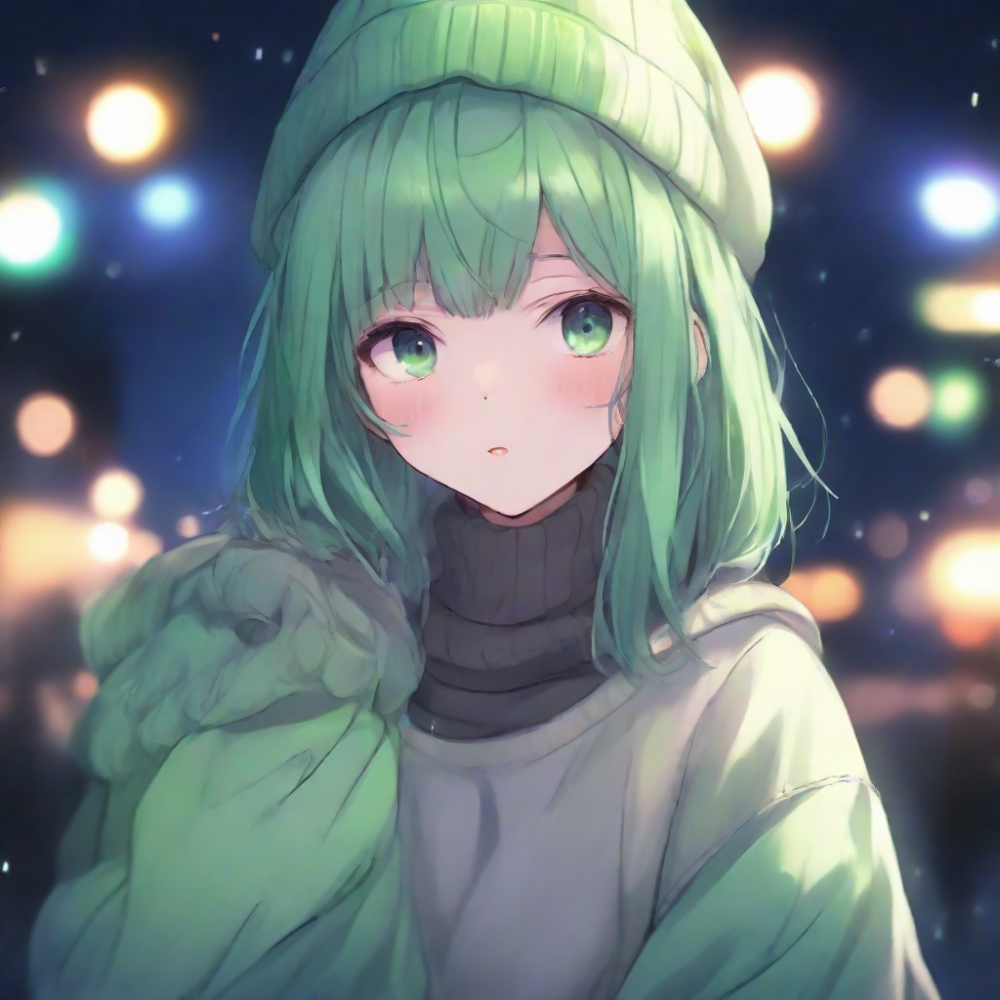

In [1]:
import torch

from diffusers import DiffusionPipeline, LCMScheduler

pipe = DiffusionPipeline.from_pretrained(
  "Linaqruf/animagine-xl",
  variant="fp16",
  torch_dtype=torch.float16
)

# set scheduler
pipe.scheduler = LCMScheduler.from_config(pipe.scheduler.config)

# load LCM-LoRA
pipe.load_lora_weights("latent-consistency/lcm-lora-sdxl")
pipe.enable_xformers_memory_efficient_attention()
pipe.enable_sequential_cpu_offload()

prompt = "face focus, cute, masterpiece, best quality, 1girl, green hair, sweater, looking at viewer, upper body, beanie, outdoors, night, turtleneck"

generator = torch.manual_seed(0)
image = pipe(
  prompt=prompt, num_inference_steps=4, generator=generator, guidance_scale=1.0
).images[0]
image

In [2]:
del pipe
torch.cuda.empty_cache()

Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

The config attributes {'skip_prk_steps': True} were passed to LCMScheduler, but are not expected and will be ignored. Please verify your scheduler_config.json configuration file.


  0%|          | 0/4 [00:00<?, ?it/s]

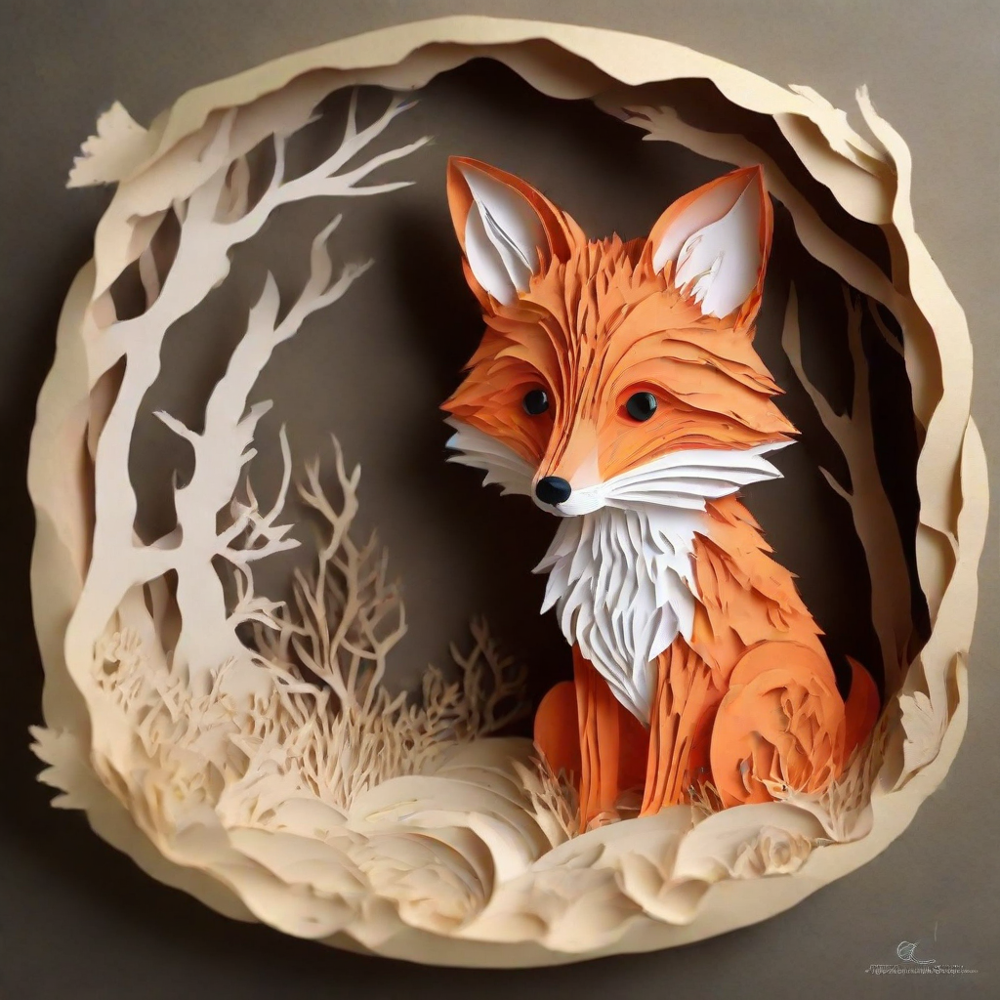

In [3]:
import torch
from diffusers import DiffusionPipeline, LCMScheduler

pipe = DiffusionPipeline.from_pretrained(
  "stabilityai/stable-diffusion-xl-base-1.0",
  variant="fp16",
  torch_dtype=torch.float16
)
pipe.enable_xformers_memory_efficient_attention()
pipe.enable_sequential_cpu_offload()

# set scheduler
pipe.scheduler = LCMScheduler.from_config(pipe.scheduler.config)

# load LoRAs
pipe.load_lora_weights("latent-consistency/lcm-lora-sdxl", adapter_name="lcm")
pipe.load_lora_weights("TheLastBen/Papercut_SDXL", weight_name="papercut.safetensors", adapter_name="papercut")

# Combine LoRAs
pipe.set_adapters(["lcm", "papercut"], adapter_weights=[1.0, 0.8])

prompt = "papercut, a cute fox"
generator = torch.manual_seed(0)
image = pipe(prompt, num_inference_steps=4, guidance_scale=1, generator=generator).images[0]
image

In [4]:
del pipe
torch.cuda.empty_cache()

Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

The config attributes {'skip_prk_steps': True} were passed to LCMScheduler, but are not expected and will be ignored. Please verify your scheduler_config.json configuration file.


  0%|          | 0/4 [00:00<?, ?it/s]

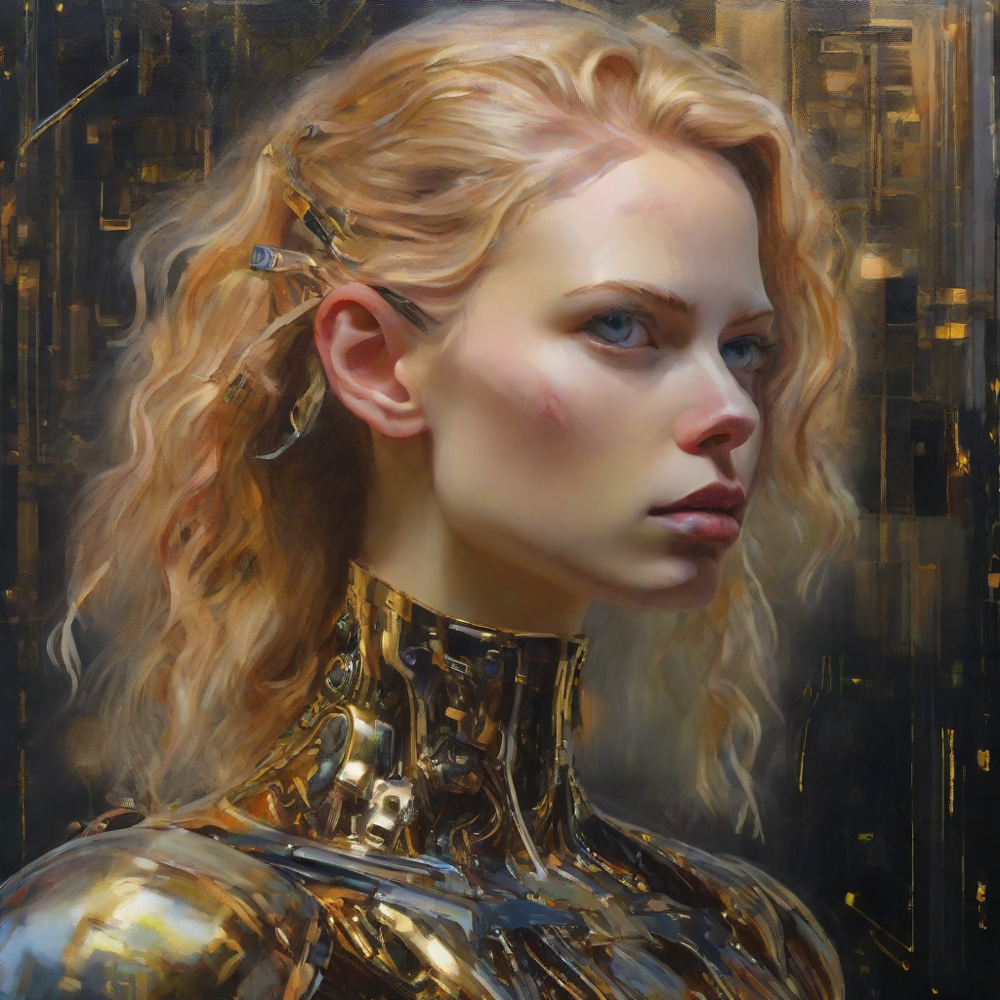

In [5]:
import torch
from diffusers import DiffusionPipeline, LCMScheduler

pipe = DiffusionPipeline.from_pretrained(
  "stabilityai/stable-diffusion-xl-base-1.0",
  variant="fp16",
  torch_dtype=torch.float16
)
pipe.enable_xformers_memory_efficient_attention()
pipe.enable_sequential_cpu_offload()

# set scheduler
pipe.scheduler = LCMScheduler.from_config(pipe.scheduler.config)

# load LCM-LoRA
pipe.load_lora_weights("latent-consistency/lcm-lora-sdxl")

prompt = "Self-portrait oil painting, a beautiful cyborg with golden hair, 8k"

generator = torch.manual_seed(42)
image = pipe(
  prompt=prompt, num_inference_steps=4, generator=generator, guidance_scale=1.0
).images[0]
image

  0%|          | 0/4 [00:00<?, ?it/s]

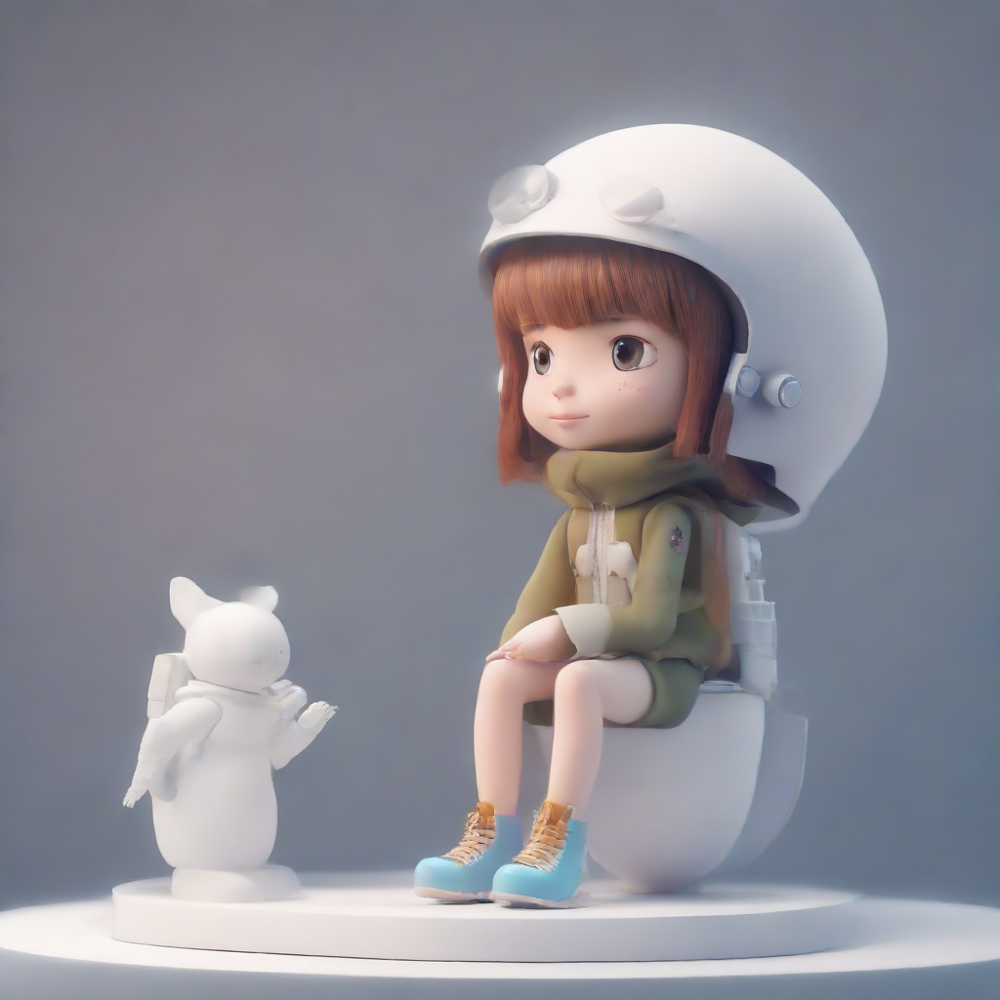

In [6]:
prompt = "Toy with a little doll with a helmet, cute 3d render, cute detailed digital art, female explorer mini cute girl, cute digital painting, stylized 3d render, cute digital art, cute render 3d anime girl , the little astronaut looks up, cute! c4d, portrait anime space cadet girl, sitting on a white pedestal"

generator = torch.manual_seed(42)
image = pipe(
  prompt=prompt, num_inference_steps=4, generator=generator, guidance_scale=1.0
).images[0]
image

  0%|          | 0/4 [00:00<?, ?it/s]

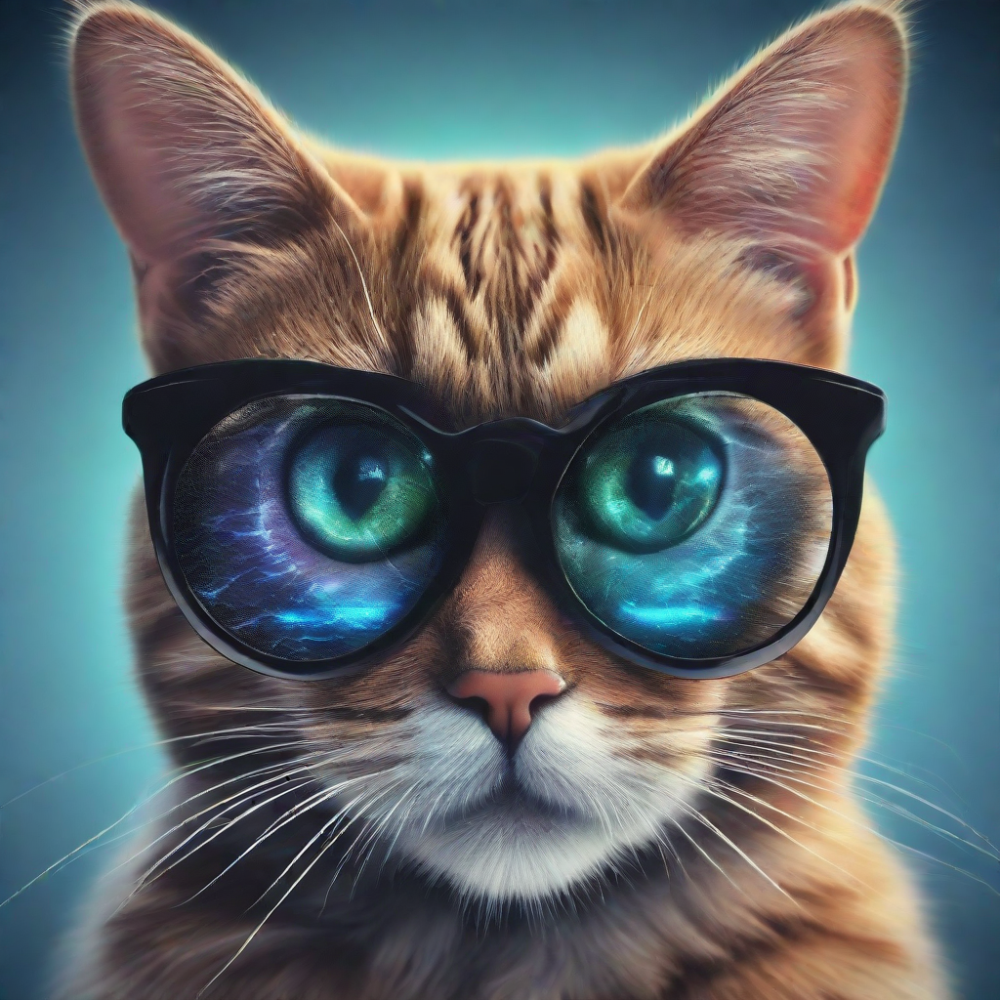

In [7]:
prompt = 'cat + glasses, cynematic light, futuristic, epic fantasy, 8k --ar 2:3'

generator = torch.manual_seed(666)
image = pipe(
  prompt=prompt, num_inference_steps=4, generator=generator, guidance_scale=1.0
).images[0]
image

  0%|          | 0/8 [00:00<?, ?it/s]

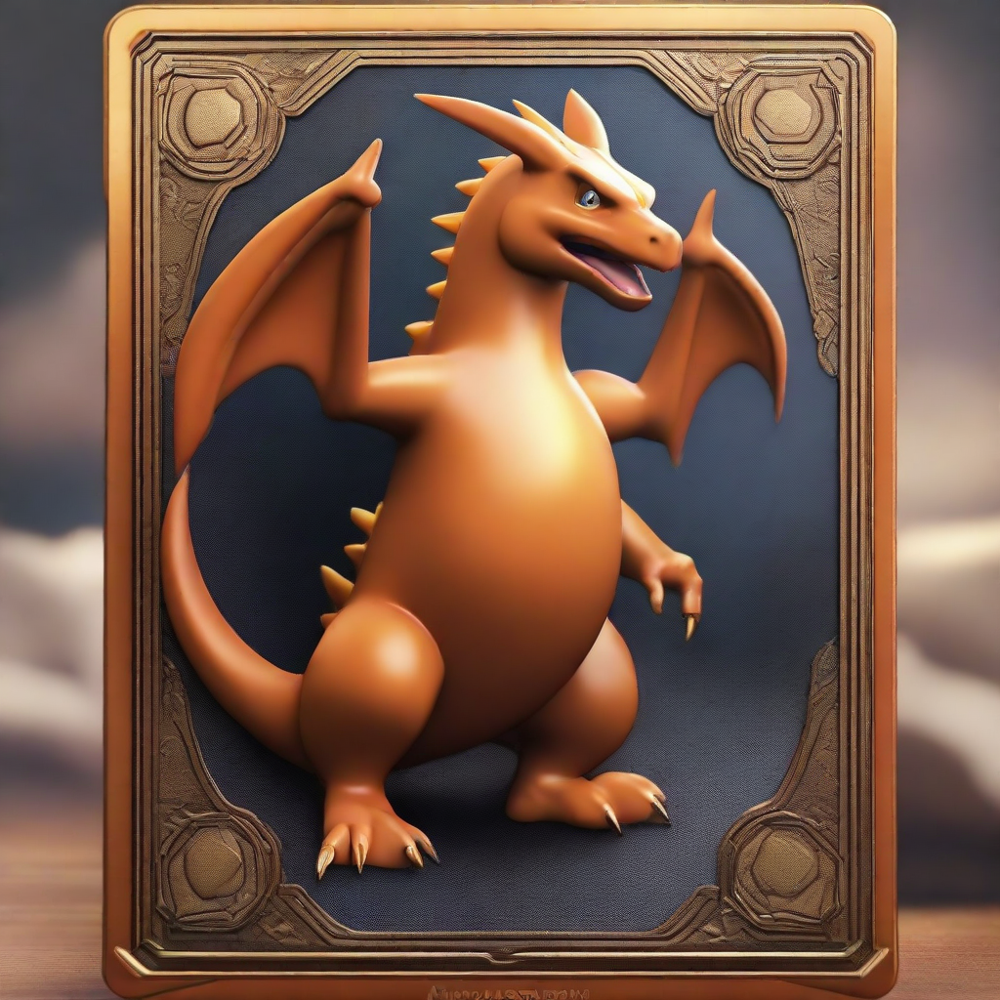

In [11]:
prompt = 'A SHINY RARE CHARIZARD Japanese Pokémon CARD with elegant features in the style of a Japanese Pokémon Graphics Card Designer, extremely detailed and intricate markings, photo realistic, unreal engine, octane render, photorealistic with 8k sharp focus quality surroundings —ar 9:16 --q 2'

generator = torch.manual_seed(199933)
image = pipe(
  prompt=prompt, num_inference_steps=8, generator=generator, guidance_scale=1.0
).images[0]
image